# Assignment 2
## Bar code detector/reader

Use a combination of image thresholding, edge detection and morphological operations to detect a bar code in an image. The workflow for this project is as follows:

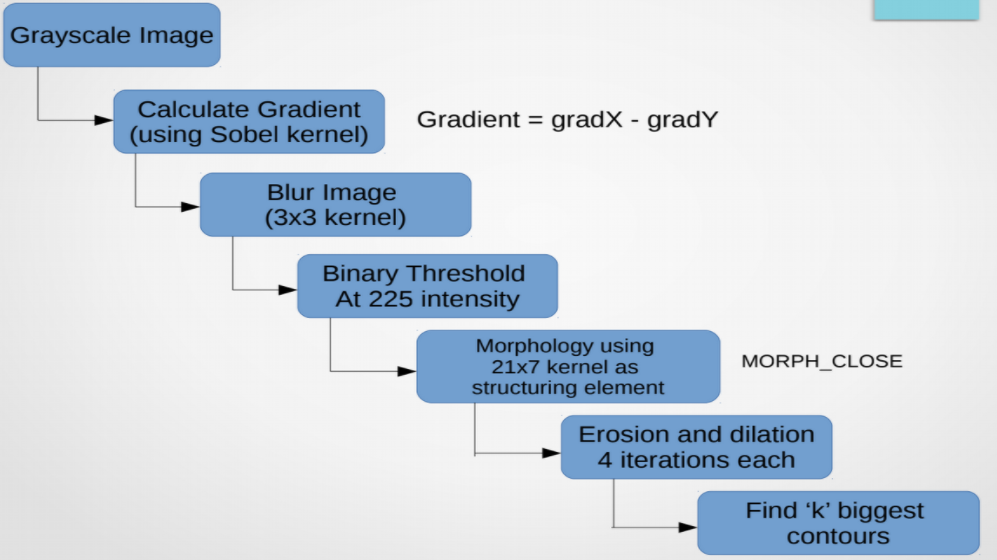

## Comments
Note that this method is one of many valid approaches to detecting bar codes in an image. There is even a Python Library, pyzbar which will automatically find and read barcodes. \
The purpose of this assignment is primarily to show how morphological processing can be used to identify features of interest in an image

Also, for the purposes of this assignment, assume only 1 bar code per image

In [1]:
# loading in required libraries
%matplotlib inline
import os
import os.path as op
import numpy as np
import cv2
import matplotlib.pylab as plt, pylab

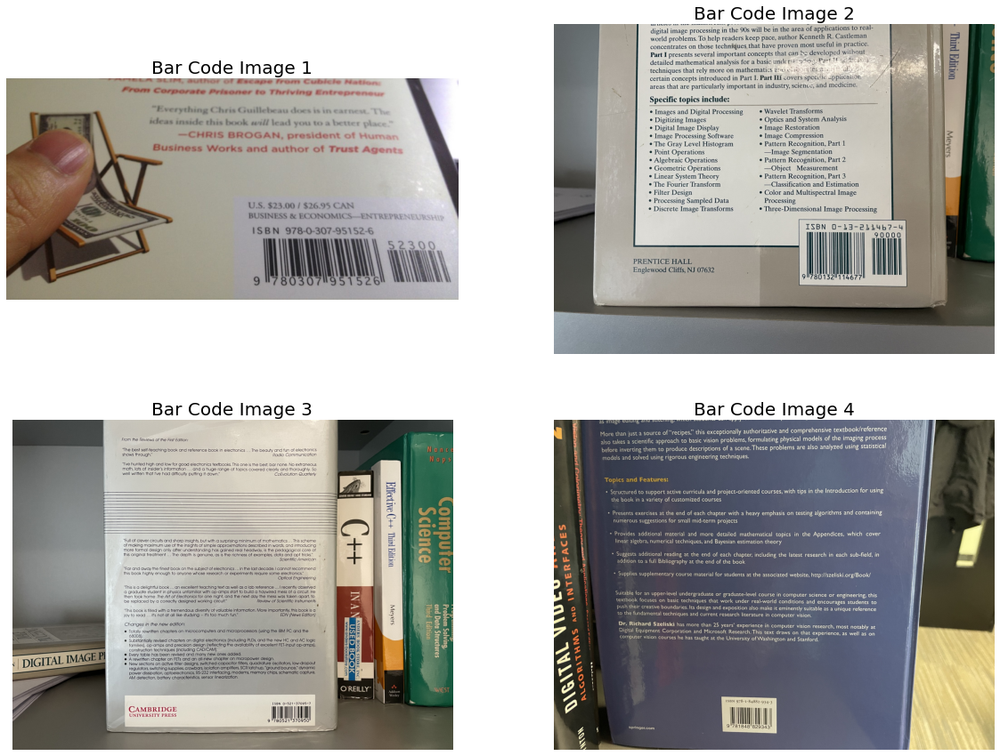

In [3]:
# reading the images
image1 = cv2.imread('bar_code1.jpg')
image2 = cv2.imread('bar_code2.jpg')
image3 = cv2.imread('bar_code3.jpg')
image4 = cv2.imread('bar_code4.jpg')

# converting the images from bgr to rgb
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)
image4 = cv2.cvtColor(image4, cv2.COLOR_BGR2RGB)

# displaying the grayscale images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(image1), pylab.axis('off')
pylab.title('Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(image2), pylab.axis('off')
pylab.title('Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(image3), pylab.axis('off')
pylab.title('Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(image4), pylab.axis('off')
pylab.title('Bar Code Image 4', size=20)
pylab.show()

## Convert image to greyscale
Use open cv cvtColor function to do this

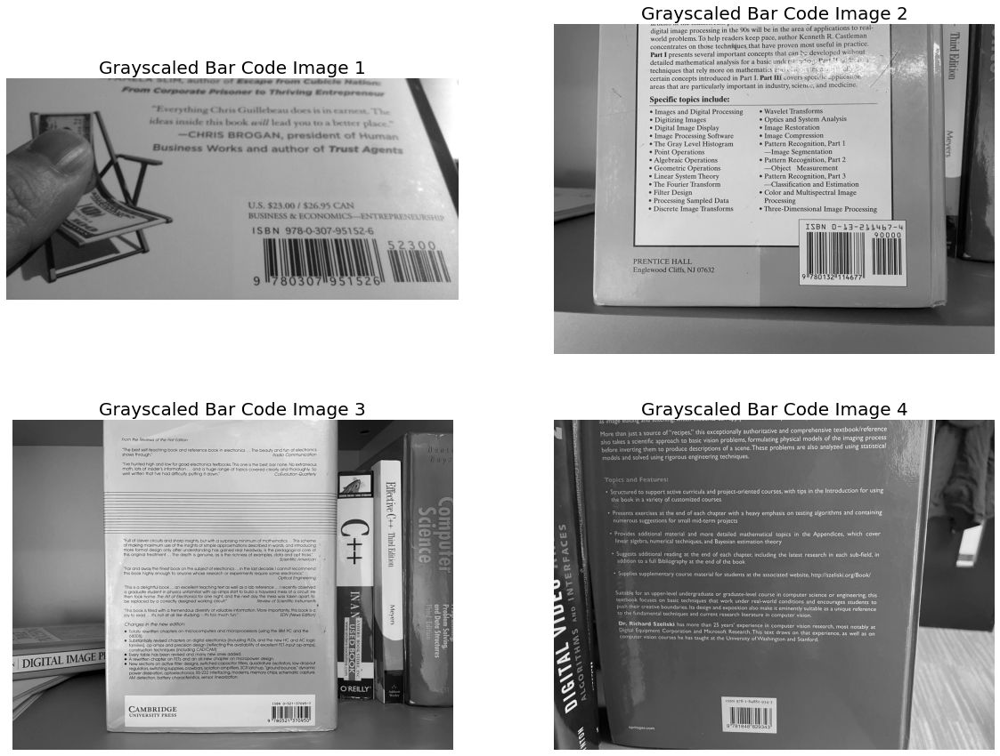

In [4]:
# converting the images to grayscale using opencv cvtColor
# here I am using cv2's cvtColor() method to convert to grayscale
greyScaledImg1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
greyScaledImg2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
greyScaledImg3 = cv2.cvtColor(image3, cv2.COLOR_BGR2GRAY)
greyScaledImg4 = cv2.cvtColor(image4, cv2.COLOR_BGR2GRAY)

# displaying the grayscaled images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(greyScaledImg1, cmap = 'gray'), pylab.axis('off')
pylab.title('Grayscaled Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(greyScaledImg2, cmap = 'gray'), pylab.axis('off')
pylab.title('Grayscaled Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(greyScaledImg3, cmap = 'gray'), pylab.axis('off')
pylab.title('Grayscaled Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(greyScaledImg4, cmap = 'gray'), pylab.axis('off')
pylab.title('Grayscaled Bar Code Image 4', size=20)
pylab.show()

## Calculate the image gradients

In this step, you need to find the image gradients (i.e. the edges of the image).
There are a number of ways to do this.

Example gradient functions are cv2.Sobel or cv2.Laplacian. If you use Sobel, it is recommended to try calculating both horizontal and vertical gradients, and use cv2.subtract to subtract x and y gradients. This is done by setting dx and dy parameters. 

experiment with differenct ksize parameters (size of filtering kernel)
For ddepth, set this to ddepth = cv2.CV_8UC1

for whichever gradient detector used, once you have calculated the gradients, scale and convert the image using cv2.convertScaleAbs function

When you plot the image, you should have something that looks like this:

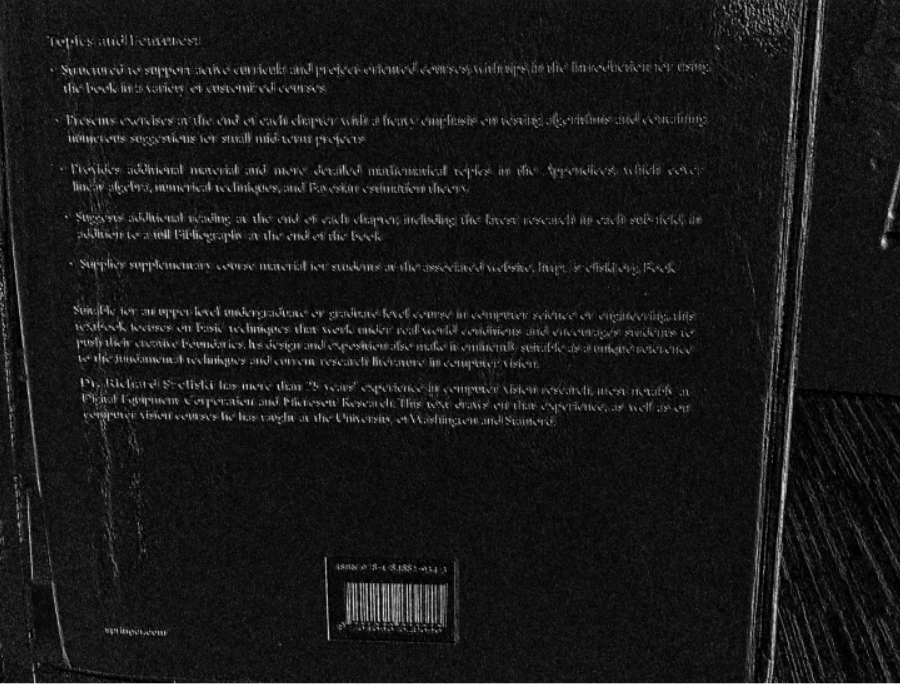


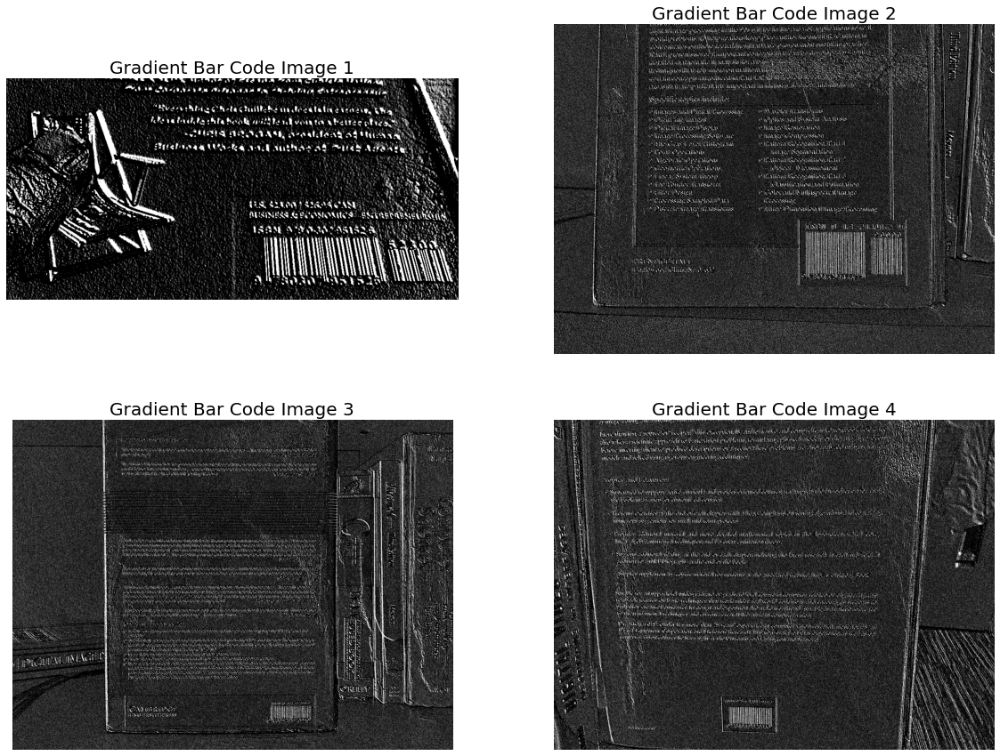

In [5]:
# calculating x & y gradient using Sobel edge detector
image1dx = cv2.Sobel(greyScaledImg1, cv2.CV_8UC1, 1, 0, ksize = 5)
image1dy = cv2.Sobel(greyScaledImg1, cv2.CV_8UC1, 0, 1, ksize = 5)

image2dx = cv2.Sobel(greyScaledImg2, cv2.CV_8UC1, 1, 0, ksize = 5)
image2dy = cv2.Sobel(greyScaledImg2, cv2.CV_8UC1, 0, 1, ksize = 5)

image3dx = cv2.Sobel(greyScaledImg3, cv2.CV_8UC1, 1, 0, ksize = 5)
image3dy = cv2.Sobel(greyScaledImg3, cv2.CV_8UC1, 0, 1, ksize = 5)

image4dx = cv2.Sobel(greyScaledImg4, cv2.CV_8UC1, 1, 0, ksize = 5)
image4dy = cv2.Sobel(greyScaledImg4, cv2.CV_8UC1, 0, 1, ksize = 5)

# subtracting the y-gradient from the x-gradient
subImage1 = cv2.subtract(image1dx, image1dy)
subImage2 = cv2.subtract(image2dx, image2dy)
subImage3 = cv2.subtract(image3dx, image3dy)
subImage4 = cv2.subtract(image4dx, image4dy)

# scaling the images using convertScaleAbs function
scaledImage1 = cv2.convertScaleAbs(subImage1)
scaledImage2 = cv2.convertScaleAbs(subImage2)
scaledImage3 = cv2.convertScaleAbs(subImage3)
scaledImage4 = cv2.convertScaleAbs(subImage4)

# displaying the gradient images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(scaledImage1, cmap = 'gray'), pylab.axis('off')
pylab.title('Gradient Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(scaledImage2, cmap = 'gray'), pylab.axis('off')
pylab.title('Gradient Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(scaledImage3, cmap = 'gray'), pylab.axis('off')
pylab.title('Gradient Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(scaledImage4, cmap = 'gray'), pylab.axis('off')
pylab.title('Gradient Bar Code Image 4', size=20)
pylab.show()

## Blur the image
This reduces noise and also removes some smaller gradients, and keeps only large gradients

Experiment with different blurring kernels, but the default cv2.blur with a kernel size of 3*3 is a good place to start...

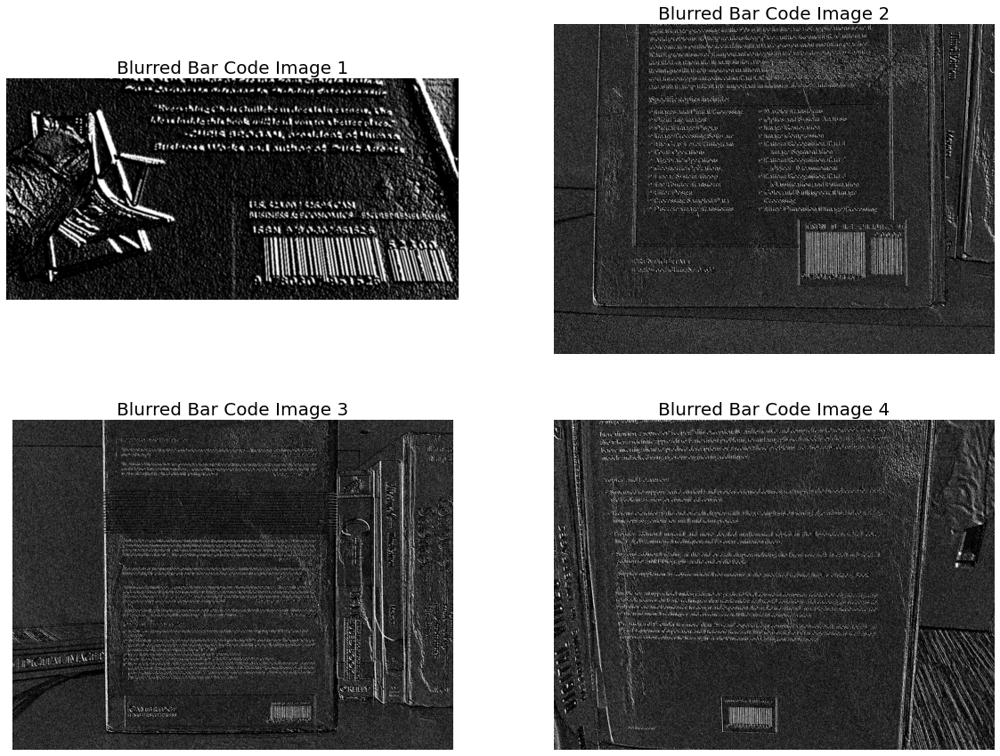

In [6]:
# blurring the images using cv2's blur() method with a kernel of size (3, 3)
blurredImage1 = cv2.blur(scaledImage1, ksize = (3, 3))
blurredImage2 = cv2.blur(scaledImage2, ksize = (3, 3))
blurredImage3 = cv2.blur(scaledImage3, ksize = (3, 3))
blurredImage4 = cv2.blur(scaledImage4, ksize = (3, 3))

# displaying the blurred images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(blurredImage1, cmap = 'gray'), pylab.axis('off')
pylab.title('Blurred Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(blurredImage2, cmap = 'gray'), pylab.axis('off')
pylab.title('Blurred Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(blurredImage3, cmap = 'gray'), pylab.axis('off')
pylab.title('Blurred Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(blurredImage4, cmap = 'gray'), pylab.axis('off')
pylab.title('Blurred Bar Code Image 4', size=20)
pylab.show()

## Convert to binary image
For this project, use manual thresholding use cv2.threshold.
Experiment with manual thresholding (approx 225 works well) to get a result where the bar code is clearly visible. 

Alternatively, you could try using Otsu's method for automatic thresholding

Your end result should look like this:

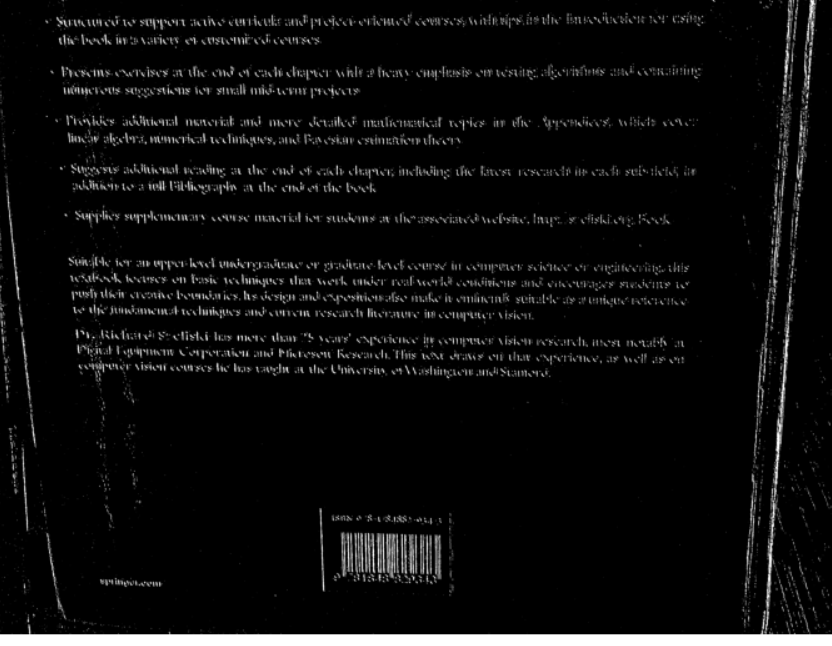

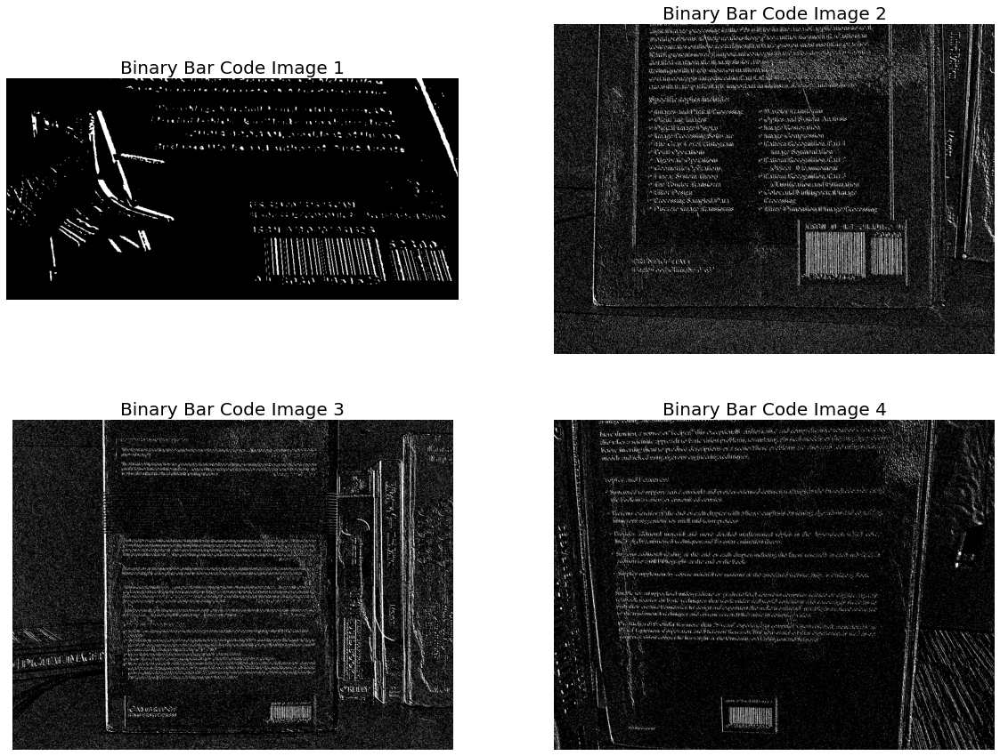

In [7]:
# thresholding the images using cv2's threshold() method
# different images will require different threshold values
# max value will always remain 255
max = 255
threshold1 = 220
threshold2 = 110
threshold3 = 110
threshold4 = 150

_, thresholdImage1 = cv2.threshold(blurredImage1, threshold1, max, cv2.THRESH_BINARY)
_, thresholdImage2 = cv2.threshold(blurredImage2, threshold2, max, cv2.THRESH_BINARY)
_, thresholdImage3 = cv2.threshold(blurredImage3, threshold3, max, cv2.THRESH_BINARY)
_, thresholdImage4 = cv2.threshold(blurredImage4, threshold4, max, cv2.THRESH_BINARY)

# displaying the thresholded images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(thresholdImage1, cmap = 'gray'), pylab.axis('off')
pylab.title('Binary Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(thresholdImage2, cmap = 'gray'), pylab.axis('off')
pylab.title('Binary Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(thresholdImage3, cmap = 'gray'), pylab.axis('off')
pylab.title('Binary Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(thresholdImage4, cmap = 'gray'), pylab.axis('off')
pylab.title('Binary Bar Code Image 4', size=20)
pylab.show()

## Perform erosion and dilation to clean up image

The purpose of this step is slightly counterintuitive - it is to define a box shaped area where the bar code is

To do this, perform the following steps:
- Define a structuring element with the function cv2.getStructuringElement. A rectangular structuring element should work well for this application...
- Perform morphological closing using the opencv morphologyEx function
- perform an additional set of erosions using opencv erode function. Experiment with the number of iterations. 4 works well..
- perform an additional set of dilations  using opencv dilate function. Experiment with the number of iterations. 4 works well..

After these operations, you should have an image that looks something like this example below. Note that the barcode is now a solid rectangle. This is the shape we wnat to find in the next step...

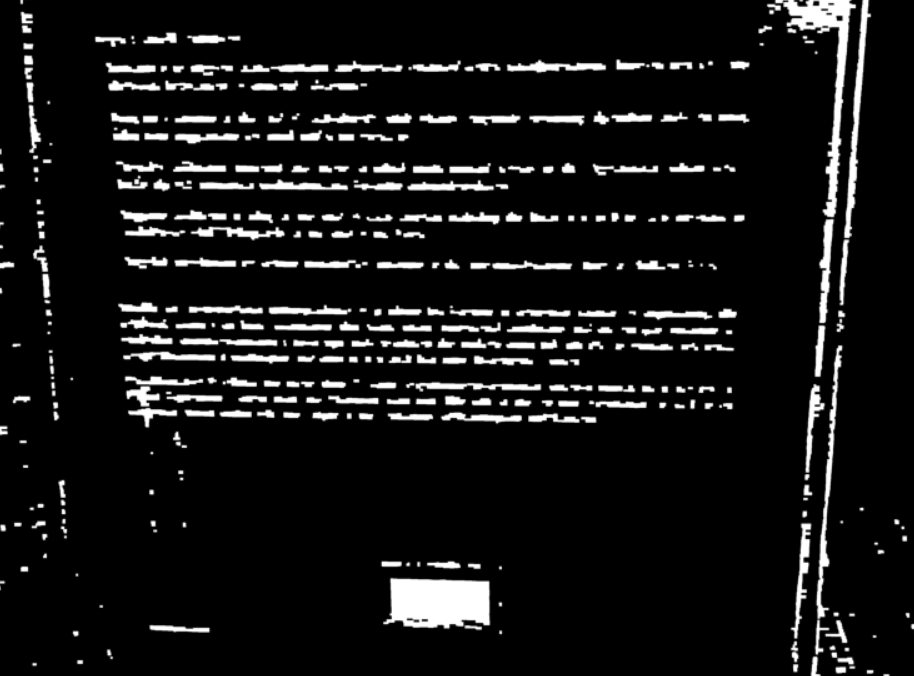

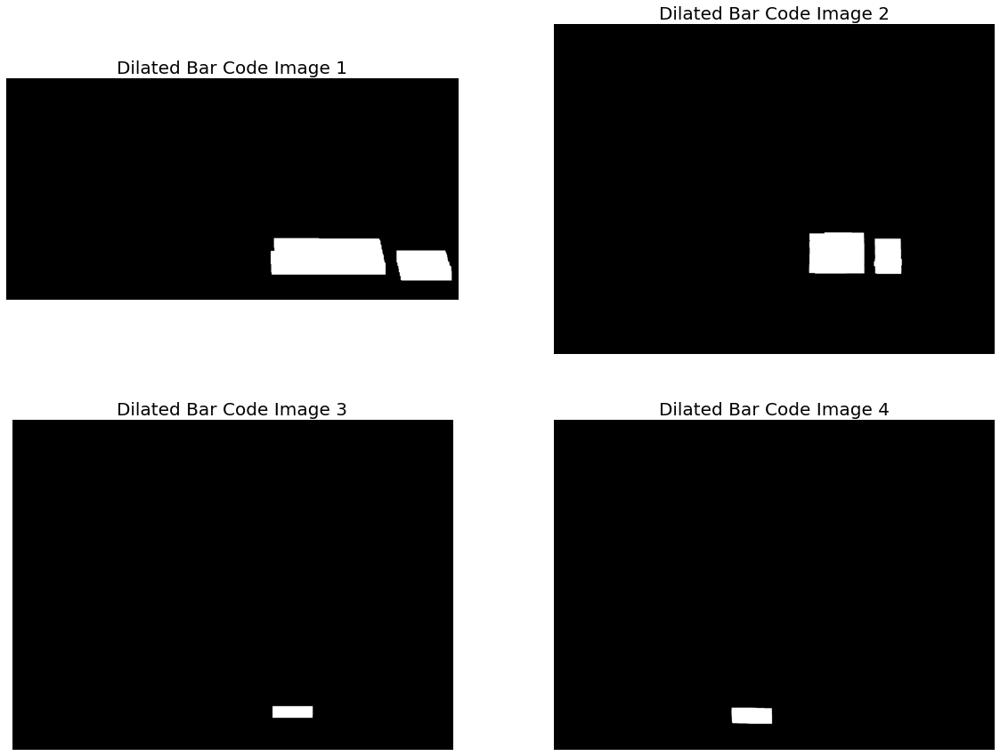

In [8]:
# constructing a closing kernel using cv2's getStructuringElement() method using
# a (20, 5) rectangle and applying it to the thresholded images using cv2's
# morphologyEx() method.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 5))

closingKernelImage1 = cv2.morphologyEx(thresholdImage1, cv2.MORPH_CLOSE, kernel)
closingKernelImage2 = cv2.morphologyEx(thresholdImage2, cv2.MORPH_CLOSE, kernel)
closingKernelImage3 = cv2.morphologyEx(thresholdImage3, cv2.MORPH_CLOSE, kernel)
closingKernelImage4 = cv2.morphologyEx(thresholdImage4, cv2.MORPH_CLOSE, kernel)

# performing a series of erosions and dilations using cv2's erode() and dilate()
# method. Process of erosion and dilation will require different number of
# iterations for different images. Figuring out the number of iterations is an
# important step.
dilatedImage1 = cv2.dilate(cv2.erode(closingKernelImage1, kernel, iterations = 5), kernel, iterations = 5)
dilatedImage2 = cv2.dilate(cv2.erode(closingKernelImage2, kernel, iterations = 13), kernel, iterations = 11)
dilatedImage3 = cv2.dilate(cv2.erode(closingKernelImage3, kernel, iterations = 15), kernel, iterations = 15)
dilatedImage4 = cv2.dilate(cv2.erode(closingKernelImage4, kernel, iterations = 10), kernel, iterations = 9)

# displaying the dilated images
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(dilatedImage1, cmap = 'gray'), pylab.axis('off')
pylab.title('Dilated Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(dilatedImage2, cmap = 'gray'), pylab.axis('off')
pylab.title('Dilated Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(dilatedImage3, cmap = 'gray'), pylab.axis('off')
pylab.title('Dilated Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(dilatedImage4, cmap = 'gray'), pylab.axis('off')
pylab.title('Dilated Bar Code Image 4', size=20)
pylab.show()

## Find the barcode

Use the opencv findContours function to find counters in your processed image. Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.

Once you have found all of the contours in the image, use the sorted function to arrange the counters by size(hint: set key = cv2.contourArea)\

Define a box around the largest contour using the opencv minAreaRect function\

Use the opencv drawContours function to draw the box around the largest contour (i.e. the barcode area)

Finally, display the output image. Your result should look something like the example below:

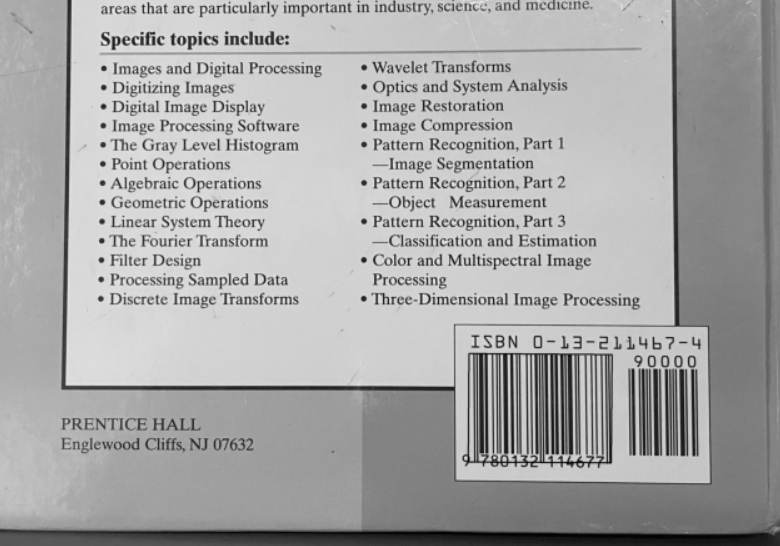




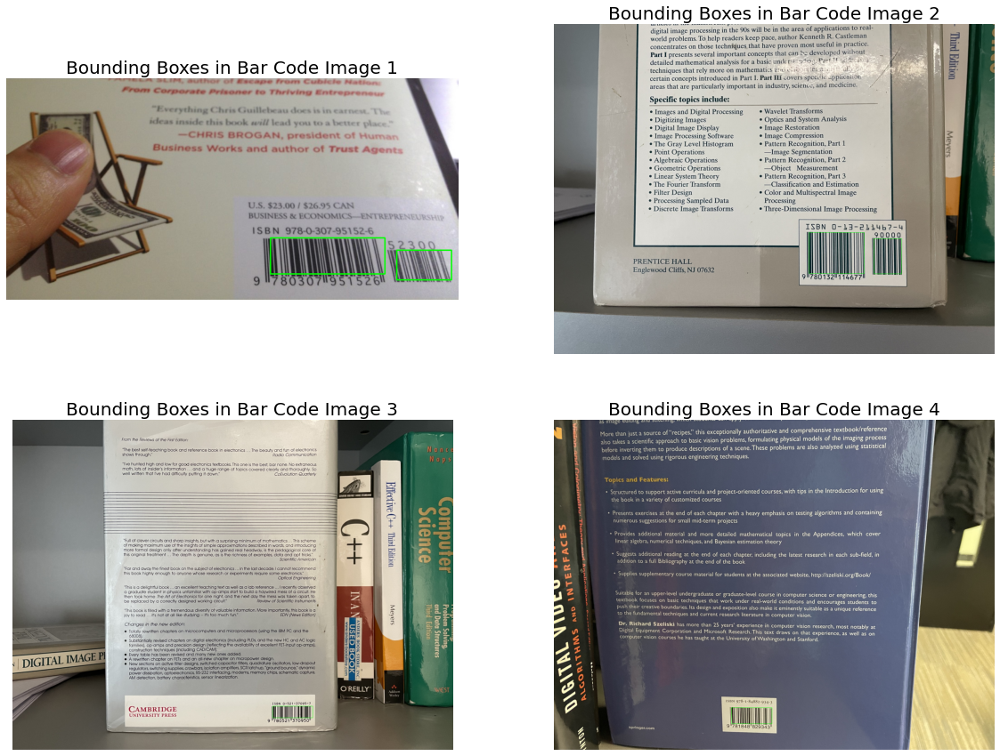

In [9]:
# defining a function which will detect all the barcodes based on the number of
# contours present in the image and drawing all the contours
def barcodeDetection(dilatedImage, originalImage):
  contours, hierarchy = cv2.findContours(dilatedImage, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_L1)

  for count in range(len(contours)):
    box = cv2.boxPoints(cv2.minAreaRect(contours[count]))
    box = np.int0(box)

    boundingBoxes = cv2.drawContours(originalImage, [box], 0, (0, 255, 0), 2)

  return boundingBoxes

boundingBox1 = barcodeDetection(dilatedImage1, image1)
boundingBox2 = barcodeDetection(dilatedImage2, image2)
boundingBox3 = barcodeDetection(dilatedImage3, image3)
boundingBox4 = barcodeDetection(dilatedImage4, image4)

# display the final images with bounding boxes
pylab.figure(figsize=(20, 15))
pylab.subplot(2, 2, 1), pylab.imshow(boundingBox1), pylab.axis('off')
pylab.title('Bounding Boxes in Bar Code Image 1', size=20)
pylab.subplot(2, 2, 2), pylab.imshow(boundingBox2), pylab.axis('off')
pylab.title('Bounding Boxes in Bar Code Image 2', size=20)
pylab.subplot(2, 2, 3), pylab.imshow(boundingBox3), pylab.axis('off')
pylab.title('Bounding Boxes in Bar Code Image 3', size=20)
pylab.subplot(2, 2, 4), pylab.imshow(boundingBox4), pylab.axis('off')
pylab.title('Bounding Boxes in Bar Code Image 4', size=20)
pylab.show()

## Suggested improvements

This process works reasonably well for many images, but will not always find the correct answer. Suggest ways to improve the performance of this algorithm. Note: stating "use deep learning", or any variation of this statement, is not allowed!!!

The important aspect of barcode detection is to accurately identify features using image processing which makes up the barcode. Therefore, we can always improve upon the way in which features are extracted. Some of the improvements that can be made according to me are:

1) We can apply contrast enhancement after carrying out edge detection using Sobel which will compensate for the illumination lost.

2) We can try to apply some combinations of morphological operations like perimeter determination, area determination, flood fill, and connected components labelling to process binary images in a better manner.

3) Sometimes the barcodes might not exactly be rectangular in shape due to the image taken in a certain manner, in that case, using the rectangle function would give inaccurate bounding box. For that, we can use cv2's polylines function along with cv2's convexHull function to get complex boundaries as well.

4) Another more crude way of improving our chances of detecting a barcode properly would be to crop the images in grids carefully to find a grid which contains the barcode and then perform the entire barcode detection process on that grid of the image only.